In [164]:
import pandas as pd
data1 = pd.read_csv("ml-100k/u.item",sep='|',encoding='latin-1',header=None,usecols=[0,1,2],names=['movie_id','movie_title','year'])
data1.head()

,movie_id,movie_title,year
0,1,Toy Story (1995),01-Jan-1995
1,2,GoldenEye (1995),01-Jan-1995
2,3,Four Rooms (1995),01-Jan-1995
3,4,Get Shorty (1995),01-Jan-1995
4,5,Copycat (1995),01-Jan-1995


In [165]:
print(len(data1))

1682


In [191]:
data1['movie_title'][266]

''

In [166]:
print(data1['movie_title'][0][:-7])

Toy Story


In [167]:
for i in range(len(data1)):
    value = data1['movie_title'][i][:-7]
    data1.loc[i,'movie_title'] = value

In [169]:
print(data1)
title = list(data1['movie_title'])
print(title)

      movie_id                         movie_title         year
0            1                           Toy Story  01-Jan-1995
1            2                           GoldenEye  01-Jan-1995
2            3                          Four Rooms  01-Jan-1995
3            4                          Get Shorty  01-Jan-1995
4            5                             Copycat  01-Jan-1995
...        ...                                 ...          ...
1677      1678                          Mat' i syn  06-Feb-1998
1678      1679                           B. Monkey  06-Feb-1998
1679      1680                       Sliding Doors  01-Jan-1998
1680      1681                        You So Crazy  01-Jan-1994
1681      1682  Scream of Stone (Schrei aus Stein)  08-Mar-1996

[1682 rows x 3 columns]
['Toy Story', 'GoldenEye', 'Four Rooms', 'Get Shorty', 'Copycat', 'Shanghai Triad (Yao a yao yao dao waipo qiao)', 'Twelve Monkeys', 'Babe', 'Dead Man Walking', 'Richard III', 'Seven (Se7en)', 'Usual Suspect

In [170]:
import re
for i in range(len(title)):
    text = title[i]
    text = re.sub('<pre><code>.*?</code></pre>', ' ', text)
    text = re.sub('<code>.*?</code>', ' ', text)
    text = re.sub('<a[^>]+>(.*)</a>', ' ', text)
    text = re.sub('<.*?>',' ', text)
    if title[i]!=text: 
        print(title[i],text,i)

In [ ]:
pip install tmdbsimple
import tmdbsimple as tmdb
import re
tmdb.API_KEY = '08d3df3441c114a6cdb87682cb5b8013'
search = tmdb.Search()

In [188]:
title[266]

''

In [221]:
response = search.movie(query='墮落天使')
results = response['results']
print(results)

[{'adult': False, 'backdrop_path': '/v4FepSc09TsRy2fQtUg6vvzrTq0.jpg', 'genre_ids': [28, 10749, 80], 'id': 11220, 'original_language': 'cn', 'original_title': '墮落天使', 'overview': 'Two tales of crimes intertwine in present-day Hong Kong. A coolly detached hitman wants to escape from his violent lifestyle – much to the dismay of his partner who is secretly besotted with him. Meanwhile, a mute ex-convict repeatedly encounters a girl during his nights of wreaking havoc.', 'popularity': 15.68, 'poster_path': '/yyM9BPdwttK5LKZSLvHae7QPKo1.jpg', 'release_date': '1995-09-06', 'title': 'Fallen Angels', 'video': False, 'vote_average': 7.7, 'vote_count': 627}, {'adult': False, 'backdrop_path': '/4KSOnimRKhEcT1cV3t8nd5NEeVQ.jpg', 'genre_ids': [18, 14, 10749], 'id': 283378, 'original_language': 'en', 'original_title': 'Fallen', 'overview': 'Lucinda Price is sent to a reform academy under the assumption that she has killed a boy. There, she meets two mysterious boys, Cam and Daniel, to whom she feel

In [233]:
descriptions = []
for i in range(len(title)):  
    text = title[i]
    if i==266 or i==1018 or i==1358:
        descriptions.append('')
    else:
        if i==242:
            text = 'Jungle 2 Jungle'
        if i==1535:
            text = '愛情萬歲'
        if i==1585:
            text = '辣手神探'
        if i==1590:
            text = '墮落天使'
        response = search.movie(query = text)
        results = response['results']
    
        if len(results) == 0:
            tn = text.split(",")[0]
            response = search.movie(query = tn)
            results = response['results']
        
        if len(results) == 0:
            tn = text.split("(")[0]
            response = search.movie(query=tn)
            results = response['results']
        
        if len(results) == 0:
            search = tmdb.Search()
            response = search.tv(query=text)
            results = response['results']
            
        if len(results) == 0:
            tn = text.split(":")[0]
            search = tmdb.Search()
            response = search.movie(query=tn)
            results = response['results']
        
        if len(results) == 0:
            print(i)
            print(text)
            break
        
        else:
            text = results[0]['overview']
            text = re.sub('<pre><code>.*?</code></pre>', ' ', text)
            text = re.sub('<code>.*?</code>', ' ', text)
            text = re.sub('<a[^>]+>(.*)</a>', ' ', text)
            text = re.sub('<.*?>',' ', text)
            descriptions.append(text)
    
print(len(descriptions))

1682


In [235]:
data1.insert(3,'descriptions',descriptions)
print(data1.head())

   movie_id movie_title         year  \
0         1   Toy Story  01-Jan-1995   
1         2   GoldenEye  01-Jan-1995   
2         3  Four Rooms  01-Jan-1995   
3         4  Get Shorty  01-Jan-1995   
4         5     Copycat  01-Jan-1995   

                                        descriptions  
0  Led by Woody, Andy's toys live happily in his ...  
1  When a powerful Russian satellite weapon is hi...  
2  It's Ted the Bellhop's first night on the job....  
3  Chili Palmer is a Miami mobster who gets sent ...  
4  An agoraphobic psychologist and a female detec...  


[0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 139]


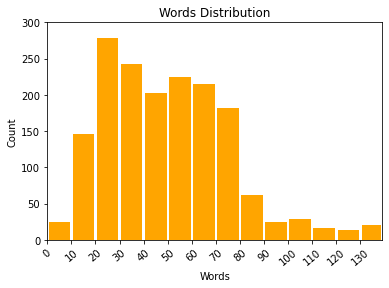

291.9322235434007
49.72116527942925


In [244]:
import numpy as np
import matplotlib.pyplot as plt
length = []
words = []
words_plot = []
for item in data1['descriptions']:
    length.append(len(item))
    text = item.split()
    words.append(len(text))
    words_plot.append(len(text) if len(text)<=130 else 139 )
bin = [n for n in range(0,140,10)]
bin.append(max(words_plot))
print(bin)

plt.hist(words_plot,bins=bin,rwidth=0.9,color='orange')
xrange = [0,max(words_plot)]
plt.xlim(xrange)
plt.xticks(range(0,max(words_plot),10),rotation=40)
plt.ylim([0,300])
plt.title('Words Distribution')
plt.xlabel('Words')
plt.ylabel('Count')
plt.show()
print(np.average(length))
print(np.average(words))

In [257]:
data2 = pd.read_csv("ml-100k/u.data",sep='\t',header=None,usecols=[0,1,2],names=['user_id', 'movie_id', 'rating'])
data2.head()

,user_id,movie_id,rating
0,196,242,3
1,186,302,3
2,22,377,1
3,244,51,2
4,166,346,1


In [331]:
user_data = pd.read_csv("ml-100k/u.data",sep='\t',header=None,usecols=[0,1,2],names=['user_id', 'movie_id', 'rating'])
user_data = user_data.sort_values(by=["user_id",'movie_id'] ,ascending=True)
user_id = list(user_data['user_id'])
movie_id = list(user_data['movie_id'])
rating = list(user_data['rating'])
user = []
interaction = []
for i in range(len(user_id)):
    user.append([user_id[i],movie_id[i],rating[i]])
    interaction.append([user_id[i],movie_id[i],rating[i]])

user = pd.DataFrame(user, columns = ['user_id','movie_id','rating'])

print(user)
print(interaction)

       user_id  movie_id  rating
0            1         1       5
1            1         2       3
2            1         3       4
3            1         4       3
4            1         5       3
...        ...       ...     ...
99995      943      1067       2
99996      943      1074       4
99997      943      1188       3
99998      943      1228       3
99999      943      1330       3

[100000 rows x 3 columns]
[[1, 1, 5], [1, 2, 3], [1, 3, 4], [1, 4, 3], [1, 5, 3], [1, 6, 5], [1, 7, 4], [1, 8, 1], [1, 9, 5], [1, 10, 3], [1, 11, 2], [1, 12, 5], [1, 13, 5], [1, 14, 5], [1, 15, 5], [1, 16, 5], [1, 17, 3], [1, 18, 4], [1, 19, 5], [1, 20, 4], [1, 21, 1], [1, 22, 4], [1, 23, 4], [1, 24, 3], [1, 25, 4], [1, 26, 3], [1, 27, 2], [1, 28, 4], [1, 29, 1], [1, 30, 3], [1, 31, 3], [1, 32, 5], [1, 33, 4], [1, 34, 2], [1, 35, 1], [1, 36, 2], [1, 37, 2], [1, 38, 3], [1, 39, 4], [1, 40, 3], [1, 41, 2], [1, 42, 5], [1, 43, 4], [1, 44, 5], [1, 45, 5], [1, 46, 4], [1, 47, 4], [1, 48, 5], [1, 49, 3

Index(['x', 'y', 'label'], dtype='object')
             x         y  label
0     2.756830  0.225415  movie
1     4.181199  0.991299  movie
2     4.181554  0.201705  movie
3     3.198039  0.862365  movie
4     3.794502  0.575208  movie
...        ...       ...    ...
1677  3.110223  0.984554  movie
1678  4.953875  0.060650  movie
1679  4.002172  0.817996  movie
1680  3.657279  0.051438  movie
1681  4.362415  0.938647  movie

[1682 rows x 3 columns]
             x         y  label
0     0.850175  0.406807   user
1     0.086031  0.902191   user
2     2.369717  0.408282   user
3     1.736222  0.248087   user
4     0.110352  0.443269   user
...        ...       ...    ...
1677  3.110223  0.984554  movie
1678  4.953875  0.060650  movie
1679  4.002172  0.817996  movie
1680  3.657279  0.051438  movie
1681  4.362415  0.938647  movie

[2625 rows x 3 columns]


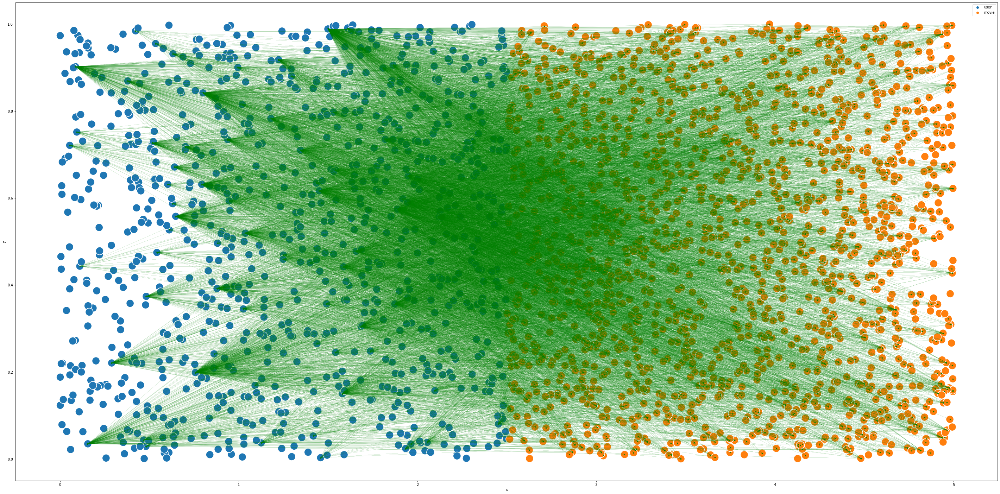

In [338]:
import matplotlib.pyplot as plt
import seaborn as sns
xloc = np.random.rand(943,2)
xloc[:,0]*=2.5
user_plot = pd.DataFrame(xloc,columns=['x','y'])
user_plot["label"] = 'user'
print(user_plot.keys())
yloc = np.random.rand(1682,2)
yloc[:,0]*=2.5
yloc[:,0]+=2.5

movie_plot = pd.DataFrame(yloc,columns=['x','y'])
movie_plot["label"] = 'movie'
print(movie_plot)

key = ['x','y']
data_plot = pd.concat([user_plot,movie_plot])
print(data_plot)
# df_SL = pd.DataFrame(embedding,columns=['x','y'])
# df_ES = pd.DataFrame(embedding,columns=['x','y'])
# df_SL["label"] = y1
# df_ES["label"] = y2

ax = plt.figure(figsize=(50,25))
sns.scatterplot(x="x", y="y",data=data_plot,hue='label',s=500)
# for i in range(len(interaction)):
for i in range(10000):
    a_xloc = user_plot.loc[interaction[i][0],'x']
    a_yloc = user_plot.loc[interaction[i][0],'y']
    b_xloc = movie_plot.loc[interaction[i][1],'x']
    b_yloc = movie_plot.loc[interaction[i][1],'y']
    x_plot = (a_xloc,b_xloc)
    y_plot = (a_yloc,b_yloc)
    plt.plot(x_plot,y_plot,color='green',linestyle='-',linewidth=0.15,marker='*',markersize=3)
plt.legend()
# plt.savefig("SL_interaction.png")
plt.show()


In [ ]:
for i in range(len(user_data)):
    user_id = user_data['user_id'][i]
    movie_id = user_data['movie_id'][i]
    rating = user_data['rating'][i]
    interaction = [user_id,movie_id,rating]
    print(interaction)
    break

In [249]:
data=pd.merge(data1,data2,on='movie_id')
data.head(10)

,movie_id,movie_title,year,descriptions,user_id,rating
0,1,Toy Story,01-Jan-1995,"Led by Woody, Andy's toys live happily in his ...",308,4
1,1,Toy Story,01-Jan-1995,"Led by Woody, Andy's toys live happily in his ...",287,5
2,1,Toy Story,01-Jan-1995,"Led by Woody, Andy's toys live happily in his ...",148,4
3,1,Toy Story,01-Jan-1995,"Led by Woody, Andy's toys live happily in his ...",280,4
4,1,Toy Story,01-Jan-1995,"Led by Woody, Andy's toys live happily in his ...",66,3
5,1,Toy Story,01-Jan-1995,"Led by Woody, Andy's toys live happily in his ...",5,4
6,1,Toy Story,01-Jan-1995,"Led by Woody, Andy's toys live happily in his ...",109,4
7,1,Toy Story,01-Jan-1995,"Led by Woody, Andy's toys live happily in his ...",181,3
8,1,Toy Story,01-Jan-1995,"Led by Woody, Andy's toys live happily in his ...",95,5
9,1,Toy Story,01-Jan-1995,"Led by Woody, Andy's toys live happily in his ...",268,3


In [250]:
data['movie_title']

0                                 Toy Story
1                                 Toy Story
2                                 Toy Story
3                                 Toy Story
4                                 Toy Story
                        ...                
99995                            Mat' i syn
99996                             B. Monkey
99997                         Sliding Doors
99998                          You So Crazy
99999    Scream of Stone (Schrei aus Stein)
Name: movie_title, Length: 100000, dtype: object

In [65]:
data['movie_title'][0][-6:]

'(1995)'

In [91]:
for item in data['movie_title']:
    print(item[:-7])

Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story
Toy Story


From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn
From Dusk Till Dawn


Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
Hoop Dreams
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.Q.
I.

Four Weddings and a Funeral
Four Weddings and a Funeral
Four Weddings and a Funeral
Four Weddings and a Funeral
Four Weddings and a Funeral
Four Weddings and a Funeral
Four Weddings and a Funeral
Four Weddings and a Funeral
Four Weddings and a Funeral
Four Weddings and a Funeral
Four Weddings and a Funeral
Four Weddings and a Funeral
Four Weddings and a Funeral
Four Weddings and a Funeral
Four Weddings and a Funeral
Four Weddings and a Funeral
Four Weddings and a Funeral
Four Weddings and a Funeral
Four Weddings and a Funeral
Four Weddings and a Funeral
Four Weddings and a Funeral
Four Weddings and a Funeral
Four Weddings and a Funeral
Four Weddings and a Funeral
Four Weddings and a Funeral
Four Weddings and a Funeral
Four Weddings and a Funeral
Four Weddings and a Funeral
Four Weddings and a Funeral
Four Weddings and a Funeral
Four Weddings and a Funeral
Four Weddings and a Funeral
Four Weddings and a Funeral
Four Weddings and a Funeral
Four Weddings and a Funeral
Four Weddings and a 

Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Aladdin
Terminator 2: Judgment Day
Terminator 2: Judgment Day
Terminator 2: Judgment Day

Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The
Rock, The


Mr. Smith Goes to Washington
Mr. Smith Goes to Washington
Mr. Smith Goes to Washington
Mr. Smith Goes to Washington
Mr. Smith Goes to Washington
Mr. Smith Goes to Washington
Mr. Smith Goes to Washington
Mr. Smith Goes to Washington
Mr. Smith Goes to Washington
Mr. Smith Goes to Washington
Mr. Smith Goes to Washington
Mr. Smith Goes to Washington
Mr. Smith Goes to Washington
Mr. Smith Goes to Washington
Mr. Smith Goes to Washington
Mr. Smith Goes to Washington
Mr. Smith Goes to Washington
Mr. Smith Goes to Washington
Mr. Smith Goes to Washington
Mr. Smith Goes to Washington
Mr. Smith Goes to Washington
Mr. Smith Goes to Washington
Mr. Smith Goes to Washington
Mr. Smith Goes to Washington
Mr. Smith Goes to Washington
Mr. Smith Goes to Washington
Mr. Smith Goes to Washington
Mr. Smith Goes to Washington
Mr. Smith Goes to Washington
Mr. Smith Goes to Washington
Mr. Smith Goes to Washington
Mr. Smith Goes to Washington
Mr. Smith Goes to Washington
Mr. Smith Goes to Washington
Mr. Smith Goes

Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun
Top Gun


Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse Now
Apocalypse

Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminator, The
Terminat

M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H
M*A*S*H


Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns
Young Guns

Lost World: Jurassic Park, The
Lost World: Jurassic Park, The
Lost World: Jurassic Park, The
Lost World: Jurassic Park, The
Lost World: Jurassic Park, The
Lost World: Jurassic Park, The
Lost World: Jurassic Park, The
Lost World: Jurassic Park, The
Lost World: Jurassic Park, The
Lost World: Jurassic Park, The
Lost World: Jurassic Park, The
Lost World: Jurassic Park, The
Lost World: Jurassic Park, The
Lost World: Jurassic Park, The
Lost World: Jurassic Park, The
Lost World: Jurassic Park, The
Lost World: Jurassic Park, The
Lost World: Jurassic Park, The
Lost World: Jurassic Park, The
Lost World: Jurassic Park, The
Lost World: Jurassic Park, The
Lost World: Jurassic Park, The
Lost World: Jurassic Park, The
Lost World: Jurassic Park, The
Lost World: Jurassic Park, The
Lost World: Jurassic Park, The
Lost World: Jurassic Park, The
Lost World: Jurassic Park, The
Lost World: Jurassic Park, The
Lost World: Jurassic Park, The
Lost World: Jurassic Park, The
Lost World: Jurassic Park, The
Lost Wor

Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Heat
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabrina
Sabri

Fierce Creatures
Fierce Creatures
Fierce Creatures
Fierce Creatures
Fierce Creatures
Fierce Creatures
Fierce Creatures
Fierce Creatures
Fierce Creatures
Fierce Creatures
Fierce Creatures
Fierce Creatures
Fierce Creatures
Fierce Creatures
Fierce Creatures
Fierce Creatures
Fierce Creatures
Fierce Creatures
Fierce Creatures
Fierce Creatures
Fierce Creatures
Fierce Creatures
Fierce Creatures
Fierce Creatures
Fierce Creatures
Fierce Creatures
Fierce Creatures
Fierce Creatures
Fierce Creatures
Fierce Creatures
Fierce Creatures
Fierce Creatures
Fierce Creatures
Fierce Creatures
Fierce Creatures
Fierce Creatures
Absolute Power
Absolute Power
Absolute Power
Absolute Power
Absolute Power
Absolute Power
Absolute Power
Absolute Power
Absolute Power
Absolute Power
Absolute Power
Absolute Power
Absolute Power
Absolute Power
Absolute Power
Absolute Power
Absolute Power
Absolute Power
Absolute Power
Absolute Power
Absolute Power
Absolute Power
Absolute Power
Absolute Power
Absolute Power
Absolute Powe

Midnight in the Garden of Good and Evil
Midnight in the Garden of Good and Evil
Midnight in the Garden of Good and Evil
Midnight in the Garden of Good and Evil
Midnight in the Garden of Good and Evil
Midnight in the Garden of Good and Evil
Midnight in the Garden of Good and Evil
Midnight in the Garden of Good and Evil
Midnight in the Garden of Good and Evil
Midnight in the Garden of Good and Evil
Midnight in the Garden of Good and Evil
Midnight in the Garden of Good and Evil
Midnight in the Garden of Good and Evil
Midnight in the Garden of Good and Evil
Midnight in the Garden of Good and Evil
Midnight in the Garden of Good and Evil
Midnight in the Garden of Good and Evil
Midnight in the Garden of Good and Evil
Midnight in the Garden of Good and Evil
Midnight in the Garden of Good and Evil
Midnight in the Garden of Good and Evil
Midnight in the Garden of Good and Evil
Midnight in the Garden of Good and Evil
Midnight in the Garden of Good and Evil
Midnight in the Garden of Good and Evil


Kiss the Girls
Kiss the Girls
Kiss the Girls
Kiss the Girls
Kiss the Girls
Kiss the Girls
Kiss the Girls
Kiss the Girls
Kiss the Girls
Kiss the Girls
Kiss the Girls
Kiss the Girls
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The
Game, The


True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies
True Lies


Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins
Mary Poppins

Jaws 2
Jaws 2
Jaws 2
Jaws 2
Jaws 2
Jaws 2
Jaws 2
Jaws 2
Jaws 2
Jaws 2
Jaws 2
Jaws 2
Jaws 2
Jaws 2
Jaws 2
Jaws 2
Jaws 2
Jaws 2
Jaws 2
Jaws 2
Jaws 2
Jaws 2
Jaws 2
Jaws 2
Jaws 2
Jaws 3-D
Jaws 3-D
Jaws 3-D
Jaws 3-D
Jaws 3-D
Jaws 3-D
Jaws 3-D
Jaws 3-D
Jaws 3-D
Jaws 3-D
Jaws 3-D
Jaws 3-D
Jaws 3-D
Jaws 3-D
Jaws 3-D
Jaws 3-D
Bastard Out of Carolina
Bastard Out of Carolina
Bastard Out of Carolina
Bastard Out of Carolina
Bastard Out of Carolina
Bastard Out of Carolina
Bastard Out of Carolina
Bastard Out of Carolina
Bastard Out of Carolina
Bastard Out of Carolina
Bastard Out of Carolina
Bastard Out of Carolina
Bastard Out of Carolina
Bastard Out of Carolina
Bastard Out of Carolina
Bastard Out of Carolina
Jackie Chan's First Strike
Jackie Chan's First Strike
Jackie Chan's First Strike
Jackie Chan's First Strike
Jackie Chan's First Strike
Jackie Chan's First Strike
Jackie Chan's First Strike
Jackie Chan's First Strike
Jackie Chan's First Strike
Jackie Chan's First Strike
Jackie Chan's First Strike


My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady
My Fair Lady

Manhattan
Manhattan
Manhattan
Manhattan
Manhattan
Manhattan
Manhattan
Manhattan
Manhattan
Manhattan
Manhattan
Manhattan
Manhattan
Manhattan
Manhattan
Manhattan
Manhattan
Manhattan
Manhattan
Manhattan
Manhattan
Manhattan
Manhattan
Manhattan
Manhattan
Manhattan
Manhattan
Manhattan
Manhattan
Manhattan
Manhattan
Manhattan
Manhattan
Manhattan
Miller's Crossing
Miller's Crossing
Miller's Crossing
Miller's Crossing
Miller's Crossing
Miller's Crossing
Miller's Crossing
Miller's Crossing
Miller's Crossing
Miller's Crossing
Miller's Crossing
Miller's Crossing
Miller's Crossing
Miller's Crossing
Miller's Crossing
Miller's Crossing
Miller's Crossing
Miller's Crossing
Miller's Crossing
Miller's Crossing
Miller's Crossing
Miller's Crossing
Miller's Crossing
Miller's Crossing
Miller's Crossing
Miller's Crossing
Miller's Crossing
Miller's Crossing
Miller's Crossing
Miller's Crossing
Miller's Crossing
Miller's Crossing
Miller's Crossing
Miller's Crossing
Miller's Crossing
Miller's Crossing
Miller's Cro

Clear and Present Danger
Clear and Present Danger
Clear and Present Danger
Clear and Present Danger
Clear and Present Danger
Clear and Present Danger
Clear and Present Danger
Clear and Present Danger
Clear and Present Danger
Clear and Present Danger
Clear and Present Danger
Clear and Present Danger
Clear and Present Danger
Clear and Present Danger
Clear and Present Danger
Clear and Present Danger
Clear and Present Danger
Clear and Present Danger
Clear and Present Danger
Clear and Present Danger
Clear and Present Danger
Clear and Present Danger
Clear and Present Danger
Clear and Present Danger
Clear and Present Danger
Clear and Present Danger
Clear and Present Danger
Clear and Present Danger
Clear and Present Danger
Clear and Present Danger
Clear and Present Danger
Clear and Present Danger
Clear and Present Danger
Clear and Present Danger
Clear and Present Danger
Clear and Present Danger
Clear and Present Danger
Clear and Present Danger
Clear and Present Danger
Clear and Present Danger


Sword in the Stone, The
Sword in the Stone, The
Sword in the Stone, The
Sword in the Stone, The
Sword in the Stone, The
Sword in the Stone, The
Sword in the Stone, The
Sword in the Stone, The
Sword in the Stone, The
Sword in the Stone, The
Sword in the Stone, The
Sword in the Stone, The
Sword in the Stone, The
So Dear to My Heart
So Dear to My Heart
So Dear to My Heart
So Dear to My Heart
Robin Hood: Prince of Thieves
Robin Hood: Prince of Thieves
Robin Hood: Prince of Thieves
Robin Hood: Prince of Thieves
Robin Hood: Prince of Thieves
Robin Hood: Prince of Thieves
Robin Hood: Prince of Thieves
Robin Hood: Prince of Thieves
Robin Hood: Prince of Thieves
Robin Hood: Prince of Thieves
Robin Hood: Prince of Thieves
Robin Hood: Prince of Thieves
Robin Hood: Prince of Thieves
Robin Hood: Prince of Thieves
Robin Hood: Prince of Thieves
Robin Hood: Prince of Thieves
Robin Hood: Prince of Thieves
Robin Hood: Prince of Thieves
Robin Hood: Prince of Thieves
Robin Hood: Prince of Thieves
Robin Ho

Alien 3
Alien 3
Alien 3
Alien 3
Blood For Dracula (Andy Warhol's Dracula)
Blood For Dracula (Andy Warhol's Dracula)
Blood For Dracula (Andy Warhol's Dracula)
Blood For Dracula (Andy Warhol's Dracula)
Blood For Dracula (Andy Warhol's Dracula)
Audrey Rose
Audrey Rose
Audrey Rose
Audrey Rose
Audrey Rose
Audrey Rose
Audrey Rose
Audrey Rose
Audrey Rose
Audrey Rose
Audrey Rose
Audrey Rose
Blood Beach
Blood Beach
Blood Beach
Blood Beach
Blood Beach
Blood Beach
Body Parts
Body Parts
Body Parts
Body Parts
Body Parts
Body Parts
Body Parts
Body Parts
Body Parts
Body Parts
Body Parts
Body Parts
Body Parts
Body Snatchers
Body Snatchers
Body Snatchers
Body Snatchers
Body Snatchers
Body Snatchers
Body Snatchers
Body Snatchers
Body Snatchers
Body Snatchers
Body Snatchers
Body Snatchers
Body Snatchers
Body Snatchers
Body Snatchers
Body Snatchers
Body Snatchers
Body Snatchers
Body Snatchers
Body Snatchers
Body Snatchers
Body Snatchers
Body Snatchers
Body Snatchers
Body Snatchers
Body Snatchers
Body Snat

First Knight
First Knight
First Knight
First Knight
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Mallrats
Nine Months
Nine Months
Nine Months
Nine Months
Nine Months
Nine Months
Nine Months
Nine Months
Nine Months
Nine Months
Nine Months
Nine Months
Nine Months
Nine Months
Nine Months
Nine Months
Nine Months
Nine Months
Nine Months
Nine Months
Nine Months
Nine Months
Nine Months
Nine Months
Nine Months
Nine Months
Nine Months
Nine Months
Nine Months
Nine Months
Nine Months
Nine Months
Nine Months
Nine Months
Nine Months
Nine Months
Nine Months
Nine Months
Nine M

Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautiful Girls
Beautifu

Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Diva
Night on Earth
Night on Earth
Night on Earth
Night on Earth
Night on Earth
Night on Earth
Night on Earth
Night on Earth
Night on Earth
Night on Earth
Night on Earth
Night on Earth
Night on Earth
Night on Earth
Night on Earth
Night on Earth
Night on Earth
Night on Earth
Night on Earth
Night on Earth
Night on Earth
Night on Earth
Night on Earth
Night on Earth
Night on Earth
Night on Earth
Night on Earth
Night on Earth
Night on Earth
Night on Earth
Night on Earth
Night on Earth
Night on Earth
Night on Earth
Night on Earth
Night on Earth
Paris Was a Woman
Amityville: Dollhouse
Amityville: Dollhouse
Amityville: Dollhouse
April Fool's Day
April Fool's Day
April Fool's Day
April Fool's Day
Apr

Fox and the Hound, The
Fox and the Hound, The
Fox and the Hound, The
Fox and the Hound, The
Fox and the Hound, The
Fox and the Hound, The
Fox and the Hound, The
Fox and the Hound, The
Fox and the Hound, The
Fox and the Hound, The
Fox and the Hound, The
Fox and the Hound, The
Fox and the Hound, The
Fox and the Hound, The
Fox and the Hound, The
Fox and the Hound, The
Fox and the Hound, The
Fox and the Hound, The
Fox and the Hound, The
Fox and the Hound, The
Fox and the Hound, The
Fox and the Hound, The
Fox and the Hound, The
Fox and the Hound, The
Fox and the Hound, The
Fox and the Hound, The
Fox and the Hound, The
Fox and the Hound, The
Fox and the Hound, The
Fox and the Hound, The
Fox and the Hound, The
Fox and the Hound, The
Fox and the Hound, The
Fox and the Hound, The
Fox and the Hound, The
Fox and the Hound, The
Fox and the Hound, The
Fox and the Hound, The
Fox and the Hound, The
Fox and the Hound, The
Fox and the Hound, The
Fox and the Hound, The
Fox and the Hound, The
Fox and the

Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Hamlet
Two if by Sea
Two if by Sea
Two if by Sea
Two if by Sea
Two if by Sea
Two if by Sea
Two if by Sea
Two if by Sea
Two if by Sea
Two if by Sea
Two if by Sea
Two if by Sea
Two if by Sea
Two if by Sea
Two if by Sea
Two if by Sea
Two if by Sea
Two if by Sea
Two if by Sea
Two if by Sea
Two if by Sea
Two if by Sea
Two if by Sea
Two if by Sea
Two if by Sea
Forget Paris
Forget Paris
Forget Paris
Forget Paris
Forget Paris
Forget Pari

Assassins
Friday
Friday
Friday
Friday
Friday
Friday
Friday
Friday
Friday
Friday
Friday
Friday
Friday
Friday
Friday
Friday
Friday
Friday
Friday
Friday
Friday
Friday
Friday
Friday
Friday
Friday
Goofy Movie, A
Goofy Movie, A
Goofy Movie, A
Goofy Movie, A
Goofy Movie, A
Goofy Movie, A
Goofy Movie, A
Goofy Movie, A
Goofy Movie, A
Goofy Movie, A
Goofy Movie, A
Goofy Movie, A
Goofy Movie, A
Goofy Movie, A
Goofy Movie, A
Goofy Movie, A
Goofy Movie, A
Goofy Movie, A
Goofy Movie, A
Goofy Movie, A
Higher Learning
Higher Learning
Higher Learning
Higher Learning
Higher Learning
Higher Learning
Higher Learning
Higher Learning
Higher Learning
Higher Learning
Higher Learning
Higher Learning
Higher Learning
Higher Learning
Higher Learning
Higher Learning
Higher Learning
Higher Learning
Higher Learning
Higher Learning
Higher Learning
Higher Learning
Higher Learning
Higher Learning
Higher Learning
Higher Learning
Higher Learning
Higher Learning
Higher Learning
Higher Learning
When a Man Loves a Woman
Whe

In [92]:
# value = data['movie_title'][0][:-6]
# print(value)
# data.loc[0,'movie_title'] = value
# print(data['movie_title'][0])
for i in range(len(data)):
    value = data['movie_title'][i][:-7]
    data.loc[i,'movie_title'] = value

In [93]:
data['movie_title']

0                                 Toy Story
1                                 Toy Story
2                                 Toy Story
3                                 Toy Story
4                                 Toy Story
                        ...                
99995                            Mat' i syn
99996                             B. Monkey
99997                         Sliding Doors
99998                          You So Crazy
99999    Scream of Stone (Schrei aus Stein)
Name: movie_title, Length: 100000, dtype: object

In [94]:
title = list(data['movie_title'])

In [95]:
print(title)
print(len(title))

['Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story', 'Toy Story'

In [96]:
lst = set(title)
print(lst)
print(len(lst))

{'', 'Delta of Venus', 'Ruling Class, The', 'Original Gangstas', 'Mr. Magoo', 'Convent, The (Convento, O)', 'My Fellow Americans', 'Of Human Bondage', 'Goofy Movie, A', 'Reservoir Dogs', 'Stealing Beauty', 'Stalingrad', 'Vertigo', 'Addiction, The', 'Sweet Hereafter, The', 'Sudden Death', 'Babe', 'Dream Man', 'New Jersey Drive', 'Niagara, Niagara', 'Beavis and Butt-head Do America', 'Sunset Park', 'Fast, Cheap & Out of Control', 'Kiss of Death', 'Angus', 'Wrong Trousers, The', "Jupiter's Wife", 'Seven (Se7en)', 'Promise, The (Versprechen, Das)', 'Cyrano de Bergerac', 'Fearless', 'So Dear to My Heart', 'Country Life', 'Amityville: A New Generation', 'Under Siege 2: Dark Territory', 'Waiting to Exhale', 'Chasers', 'Apt Pupil', 'Days of Thunder', 'Madonna: Truth or Dare', 'Temptress Moon (Feng Yue)', 'Starship Troopers', 'Psycho', 'In & Out', 'Much Ado About Nothing', 'What Happened Was...', 'Cliffhanger', 'George of the Jungle', 'Alice in Wonderland', 'Kids in the Hall: Brain Candy', 'Gro

In [97]:
target = set(lst)&set(name)
print(target)

{'Star Trek: Generations', 'Heavy Metal', 'Lost in Space', 'My Fellow Americans', 'Sleepers', 'Jerry Maguire', 'Timecop', "Smilla's Sense of Snow", 'Face/Off', 'Reservoir Dogs', 'Courage Under Fire', 'Showgirls', 'Babe', 'Mercury Rising', 'Some Like It Hot', 'Selena', 'Kiss of Death', 'Glory', 'Sex, Lies, and Videotape', 'Carrie', 'Soul Food', 'Volcano', 'Evita', 'Under Siege 2: Dark Territory', 'Halloween: The Curse of Michael Myers', 'Vampire in Brooklyn', 'My Fair Lady', 'Days of Thunder', 'Street Fighter', 'Speed', 'Grease', 'Starship Troopers', 'Psycho', 'In & Out', 'Twilight', '2001: A Space Odyssey', 'Much Ado About Nothing', 'Cliffhanger', 'Aliens', 'Thinner', 'George of the Jungle', 'Richard III', 'Alice in Wonderland', 'Highlander III: The Sorcerer', 'Primary Colors', 'Dances with Wolves', 'Star Trek IV: The Voyage Home', 'Jingle All the Way', 'Open Season', 'Everyone Says I Love You', "Mr. Holland's Opus", 'Fair Game', 'Mr. Smith Goes to Washington', 'Boogie Nights', 'Four W

In [98]:
print(len(target))

376


In [99]:
a = str('Crossing Guard, The')
print(a)

Crossing Guard, The


In [101]:
a = a.strip()
print(a)
text = a

Crossing Guard, The


In [103]:
text = text.replace("\n", " ").replace("(", " ").replace(")", " ").replace("\r", " ").replace("\t", " ").lower()
print(text)

crossing guard, the


crossing guard, the


Note: you may need to restart the kernel to use updated packages.


crossing guard
[{'adult': False, 'backdrop_path': '/oi9RFxqb5Tncm7VvDnVT6sZUWyH.jpg', 'genre_ids': [18, 53], 'id': 27526, 'original_language': 'en', 'original_title': 'The Crossing Guard', 'overview': 'After his daughter died in a hit and run, Freddy Gale has waited six years for John Booth, the man responsible, to be released from prison. On the day of release, Gale visits Booth and announces that he will kill him in one week. Booth uses his time to try and make peace with himself and his entourage, and even finds romance. Gale, whose life is spiraling down because of his obsession towards Booth, will bring himself on the very edge of sanity. At he end of the week, both men will find themselves on a collision course with each other.', 'popularity': 9.279, 'poster_path': '/kogaCIIylHmWQo2gJrrdq8Br8b8.jpg', 'release_date': '1995-11-15', 'title': 'The Crossing Guard', 'video': False, 'vote_average': 6.1, 'vote_count': 207}, {'adult': False, 'backdrop_path': '/eJoiDq8GYUTkjmz4vszyx0s5RlZ.

[]
